In [2]:
%matplotlib inline

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pylab
import os

pylab.rcParams['figure.figsize'] = (10.0, 8.0)

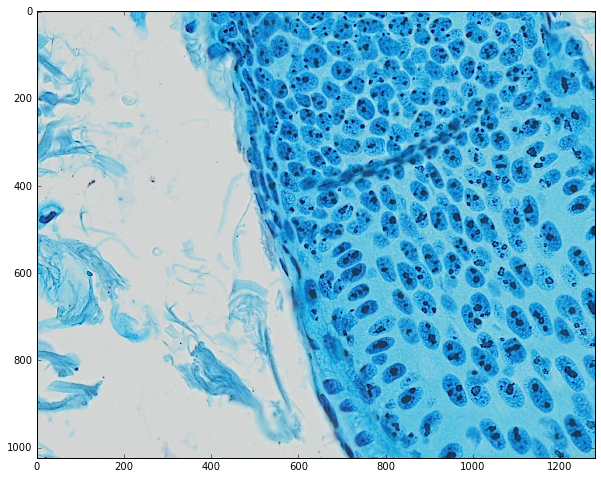

In [4]:
img = cv2.imread('Images/mp-16-2906_MCT_Ki67_942.tif')
plt.imshow(img)
plt.show()

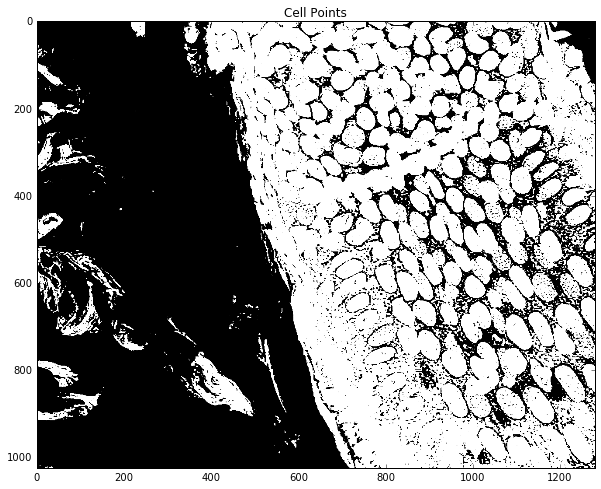

(<matplotlib.image.AxesImage at 0x88cc4a8>,
 None)

In [5]:
# ---------HSV THRESHOLDING--CELLS--------------
image = cv2.GaussianBlur(img, (0,0), 3)
frame = cv2.addWeighted(img, 1.5, image, -0.5, 0)

b,g,r = cv2.split(frame)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0] - rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

cell_points = cv2.inRange(mask, (0, 130, 0), (255,255,255))
plt.imshow(cell_points, 'gray'), plt.title("Cell Points"), plt.show()

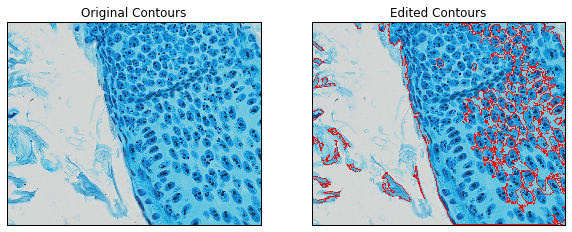

In [7]:
contours, heirarchy = cv2.findContours(cell_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cells = []
c = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    true_area = cv2.contourArea(cnt, True)
    perimeter = cv2.arcLength(cnt, True)
    if (perimeter != 0.0):
        circularity_factor = (4*np.pi*area)/(perimeter*perimeter)
        if area >= 500 and true_area < 0: #and circularity_factor >= 0.1:
            cells.append(cnt)
    
cell_img1 = cv2.imread('Images/mp-16-2906_MCT_Ki67_942.tif')
cell_img2 = cv2.imread('Images/mp-16-2906_MCT_Ki67_942.tif')
cv2.drawContours(cell_img2, cells, -1, (255,0,0),2)
cv2.drawContours(cell_img1, c, -1, (255, 255,0), 2)
#cv2.imshow("Contours", cell_img)
#cv2.waitKey(-1)
plt.subplot(121), plt.imshow(cell_img1)
plt.title("Original Contours"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cell_img2)
plt.title("Edited Contours"), plt.xticks([]), plt.yticks([])
plt.show()

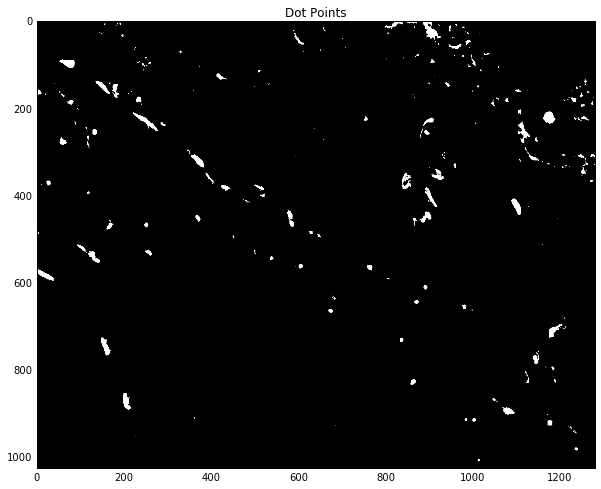

(<matplotlib.image.AxesImage at 0x817f5c0>,
 None)

In [8]:
# ---------HSV THRESHOLDING--DOTS--------------
b,g,r = cv2.split(img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0] - rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

dot_points = cv2.inRange(mask, (0, 50, 0), (255,255,150))
plt.imshow(dot_points, 'gray'), plt.title("Dot Points"), plt.show()

[array([[[1009, 1003]],

       [[1009, 1004]],

       [[1009, 1005]],

       [[1009, 1006]],

       [[1009, 1007]],

       [[1010, 1008]],

       [[1011, 1008]],

       [[1012, 1008]],

       [[1012, 1007]],

       [[1013, 1006]],

       [[1013, 1005]],

       [[1013, 1004]],

       [[1012, 1003]],

       [[1011, 1003]],

       [[1010, 1003]]]), array([[[1232,  977]],

       [[1231,  978]],

       [[1231,  979]],

       [[1231,  980]],

       [[1231,  981]],

       [[1232,  982]],

       [[1233,  982]],

       [[1234,  983]],

       [[1235,  983]],

       [[1236,  983]],

       [[1237,  982]],

       [[1238,  981]],

       [[1238,  980]],

       [[1238,  979]],

       [[1237,  978]],

       [[1236,  977]],

       [[1235,  977]],

       [[1234,  977]],

       [[1233,  977]]]), array([[[224, 949]],

       [[224, 950]],

       [[225, 950]],

       [[226, 951]],

       [[225, 950]]]), array([[[1228,  937]],

       [[1229,  938]],

       [[1228,  939]],

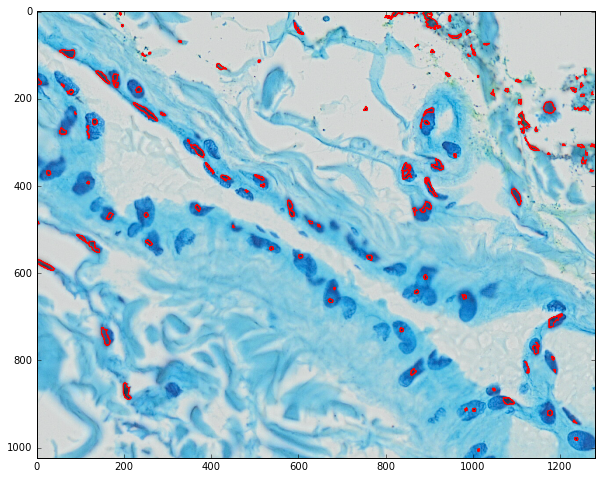

In [10]:
contours, heirarchy = cv2.findContours(dot_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
print(contours)
dots = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area >= 10:
        dots.append(cnt)
        
dot_img = cv2.imread('Images/mp-16-2906_MCT_Ki67_733.tif')
cv2.drawContours(dot_img, dots, -1, (255,0,0),2)
#cv2.imshow("Contours", dot_img)
#cv2.waitKey(-1)
plt.imshow(dot_img)
plt.show()

In [11]:
#-------TEST FOR CELLS W/ DOTS IN THEM -- PPT TEST --- 

('Cells: ', 45)
('Total: ', 3339)


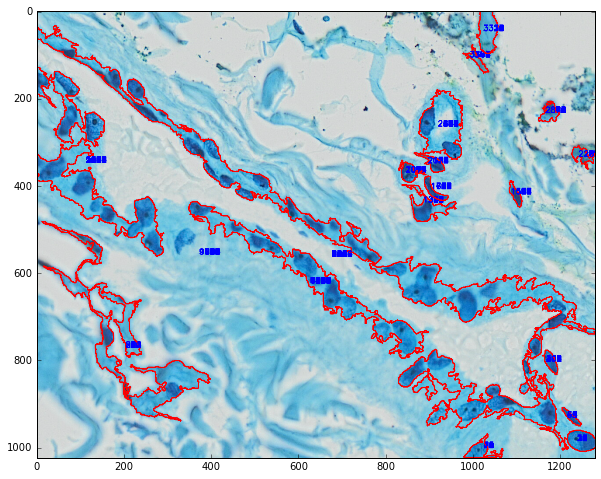

(<matplotlib.image.AxesImage at 0x104fd048>, None)

In [12]:
dots_in_cells = {}
total = []
track = -1
for i in range(len(dots)):
    for j in range(len(dots[i])):
        for m in range(len(cells)):
            x = dots[i][j][0][0]
            y = dots[i][j][0][1]
            points = (x,y)
            num  = cv2.pointPolygonTest(cells[m], points, False )
            if num == 0 or num == 1:
                total.append(cells[m])
                moment = cv2.moments(cells[m])
                if moment['m00'] != 0.0:
                    cx = moment['m10']/moment['m00']
                    cy = moment['m01']/moment['m00']
                    centroid = (cx,cy)
                    if centroid in dots_in_cells and track != i:
                        dots_in_cells[centroid] += 1
                        track += 1
                    elif centroid not in dots_in_cells and track != i:
                        dots_in_cells[centroid] = 1
                        track += 1
                
test_img = cv2.imread('Images/mp-16-2906_MCT_Ki67_733.tif')
print("Cells: ", len(cells))
print("Total: ", len(total))
for c in range(len(total)):
    (x,y),(MA,ma),angle = cv2.fitEllipse(total[c])
    #moment = cv2.moments(total[c])
    #cx = moment['m10']/moment['m00']
    #cy = moment['m01']/moment['m00']
    #centroid = (cx,cy)
    cv2.drawContours(test_img, [total[c]],-1,(255,0,0), 2)
    cv2.putText(test_img, "{}".format(c), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
#cv2.drawContours(test_img, total, -1, (255,0,0),2)
cv2.imshow("Contours", test_img)
cv2.waitKey(-1)
plt.imshow(test_img), plt.show()
#for k in dots_in_cells:
#    print("Key: ", k)
#    print("Value: ", dots_in_cells[k])

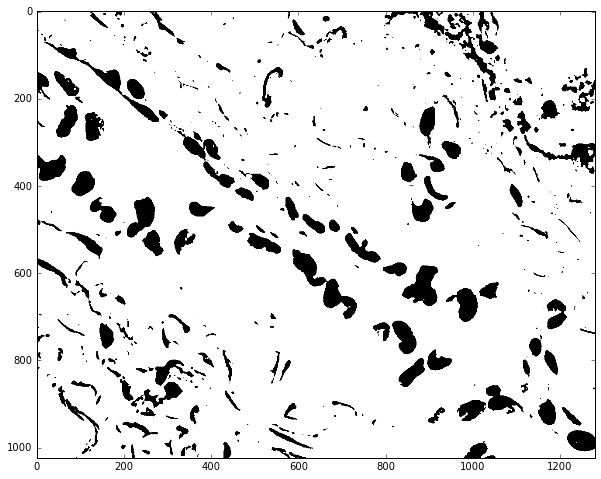

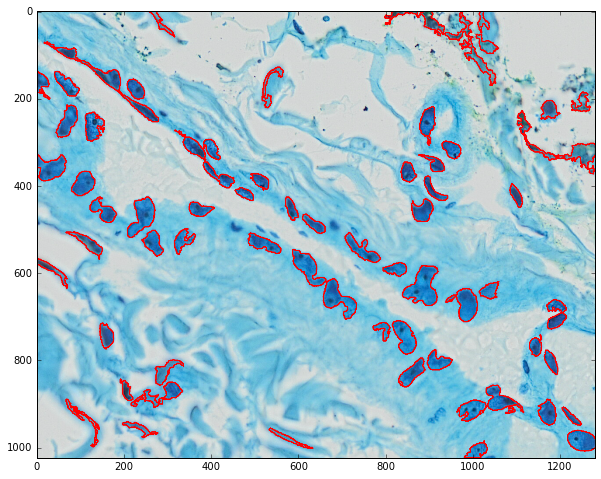

-1

In [15]:
# ---------------------- TESTING OTSU ----------------------
binary_img = cv2.imread("Images/mp-16-2906_MCT_Ki67_733.tif",0)
blur = cv2.GaussianBlur(binary_img,(5,5),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(th3, 'gray')
plt.show()
image = cv2.GaussianBlur(binary_img, (0,0), 3)
frame = cv2.addWeighted(binary_img, 1.5, image, -0.5, 0)
ret2,th2 = cv2.threshold(binary_img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
th2 = 255 - th2
contours, heirarchy = cv2.findContours(th2, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cells = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area >= 500:
        cells.append(cnt)
        
cv2.drawContours(img, cells, -1, (255,0,0),2)
plt.imshow(img, 'gray')
plt.show()
cv2.imshow("contours", img)
cv2.waitKey(-1)

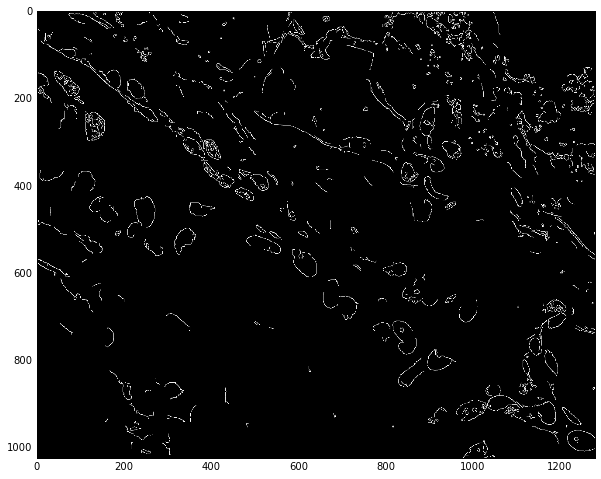

(<matplotlib.image.AxesImage at 0x110d5eb8>, None)

In [16]:
# --- TEST USING EDGE DETECTION, GRAYSCALE CONVERSION, BINARY THRESHOLD + MIN AREA -------------------------
img = cv2.imread('Images/mp-16-2906_MCT_Ki67_733.tif')
edges = cv2.Canny(img, 127, 255)
plt.imshow(edges, 'gray'), plt.show()

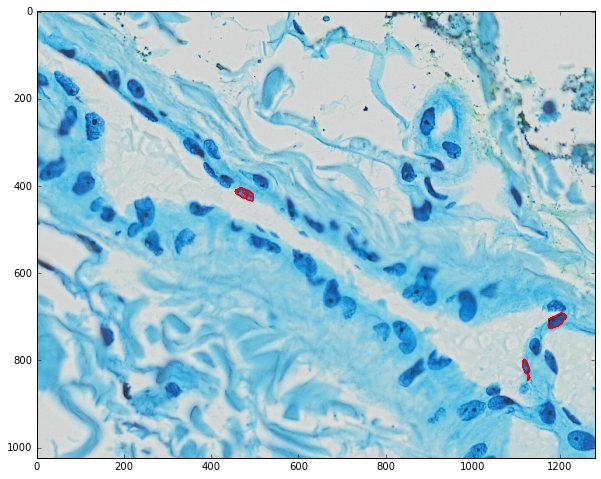

-1

In [17]:
contours, heirarchy = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cells = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area >= 250:
        cells.append(cnt)
        
cv2.drawContours(img, cells, -1, (255,0,0),2)
plt.imshow(img, 'gray')
plt.show()
cv2.imshow("contours", img)
cv2.waitKey(-1)

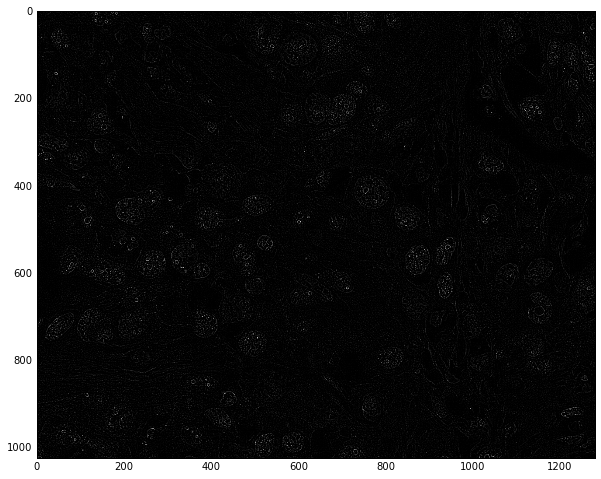

(<matplotlib.image.AxesImage at 0x17ad75c0>, None)

In [18]:
# -----------TESTING USING LAPLACIAN ---------------------
img = cv2.imread('Images/mp-16-2852_MCT_Ki67_1697.tif', 0)
laplacian = cv2.Laplacian(img, cv2.CV_8U)
plt.imshow(laplacian, 'gray'), plt.show()


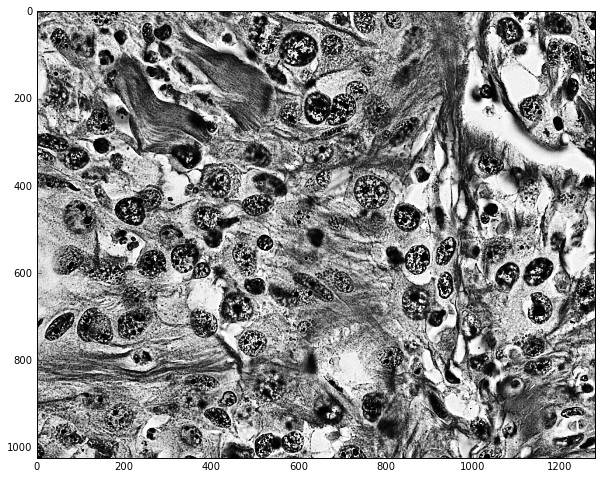

In [19]:
# --------- Test increasing contrast ----------------
img = cv2.imread("Images/mp-16-2852_MCT_Ki67_1697.tif", 0)
hist, bins = np.histogram(img.flatten(), 256, [0, 256])
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()

#plt.plot(cdf_normalized, color = 'b')
#plt.hist(img.flatten(), 256, [0, 256], color = 'r')
#plt.xlim([0,256])
#plt.legend(('cdf', 'histogram'), loc = 'upper left')
#plt.show()

cdf_m = np.ma.masked_equal(cdf, 0)
cdf_m = (cdf_m - cdf_m.min()) * 255/(cdf_m.max() - cdf_m.min())
cdf = np.ma.filled(cdf_m, 0).astype('uint8')

img2 = cdf[img]

plt.imshow(img2, 'gray')
plt.show()

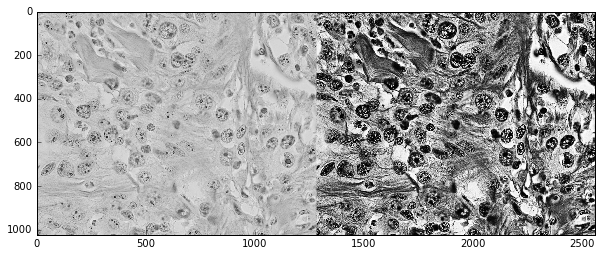

(<matplotlib.image.AxesImage at 0x10fda048>, None)

In [20]:
# --------------Test cv2.equalizeHist ------------------
img = cv2.imread("Images/mp-16-2852_MCT_Ki67_1697.tif", 0)
equ = cv2.equalizeHist(img)
res = np.hstack((img, equ))
#cv2.imwrite('res.png', res)
plt.imshow(res, 'gray'), plt.show()

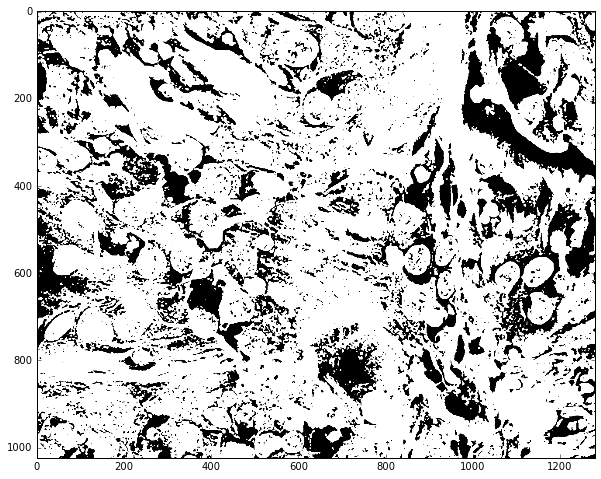

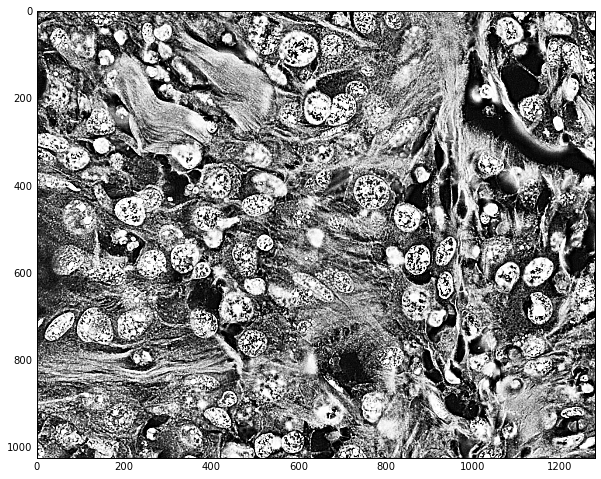

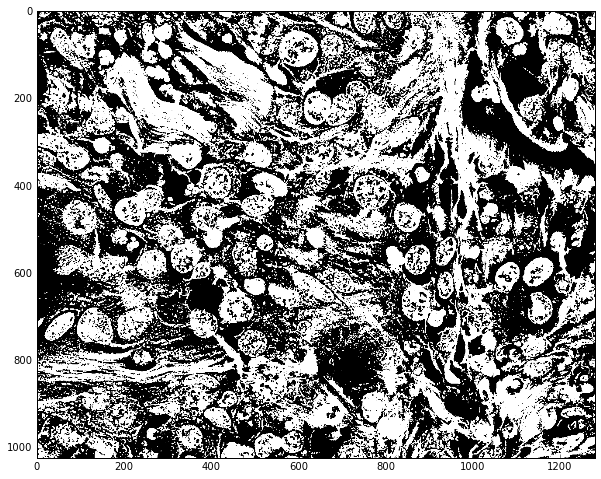

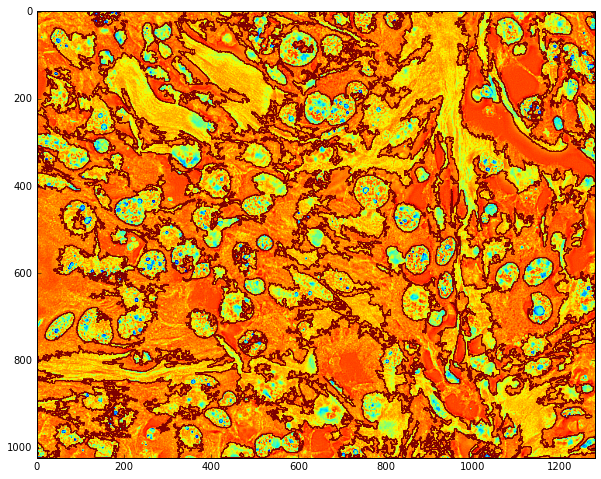

-1

In [21]:
equ = 255 - equ
blur = cv2.GaussianBlur(equ,(5,5),0)
#ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
ret3, th3 = cv2.threshold(blur, 70, 255, cv2.THRESH_BINARY)
plt.imshow(th3, 'gray')
plt.show()
image = cv2.GaussianBlur(equ, (0,0), 3)
frame = cv2.addWeighted(equ, 1.5, image, -0.5, 0)
plt.imshow(frame, 'gray')
plt.show()
ret2,th2 = cv2.threshold(equ,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(th2, 'gray')
plt.show()
contours, heirarchy = cv2.findContours(th2, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cells = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area >= 500:
        cells.append(cnt)
        
cv2.drawContours(img, cells, -1, (255,0,0),2)
plt.imshow(img)
plt.show()
cv2.imshow("contours", img)
cv2.waitKey(-1)

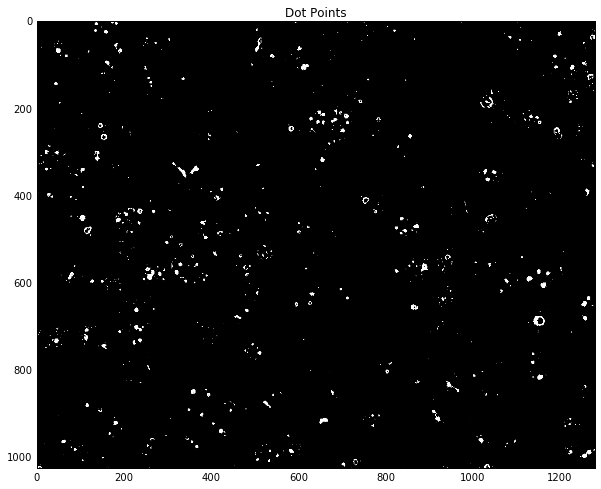

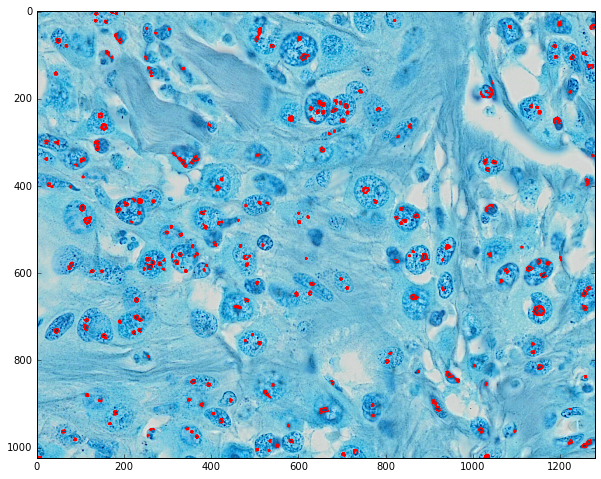

In [26]:
# ---------HSV THRESHOLDING--DOTS--------------
img = cv2.imread("Images/mp-16-2852_MCT_Ki67_1697.tif")
b,g,r = cv2.split(img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0] - rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

dot_points = cv2.inRange(mask, (0, 50, 0), (255,255,150))
plt.imshow(dot_points, 'gray'), plt.title("Dot Points"), plt.show()

contours, heirarchy = cv2.findContours(dot_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
dots = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area >= 10:
        dots.append(cnt)
        
dot_img = cv2.imread('Images/mp-16-2852_MCT_Ki67_1697.tif')
cv2.drawContours(dot_img, dots, -1, (255,0,0),2)
#cv2.imshow("Contours", dot_img)
#cv2.waitKey(-1)
plt.imshow(dot_img)
plt.show()

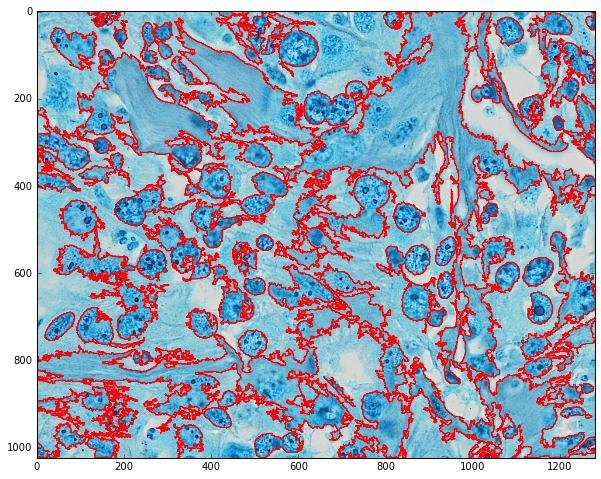

(<matplotlib.image.AxesImage at 0x18160550>, None)

In [27]:
total = []
for i in range(len(dots)):
    for j in range(len(dots[i])):
        for m in range(len(cells)):
            x = dots[i][j][0][0]
            y = dots[i][j][0][1]
            points = (x,y)
            num  = cv2.pointPolygonTest(cells[m], points, False )
            if num == 0 or num == 1:
                total.append(cells[m])
                
test_img = cv2.imread('Images/mp-16-2852_MCT_Ki67_1697.tif')
cv2.drawContours(test_img, total, -1, (255,0,0),2)
cv2.imshow("Contours", test_img)
cv2.waitKey(-1)
plt.imshow(test_img), plt.show()

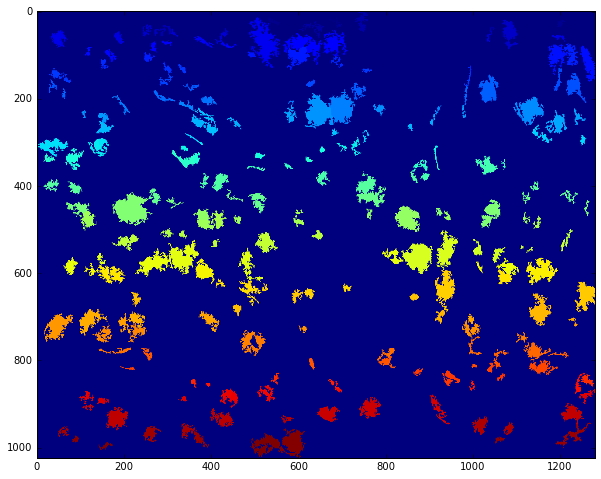

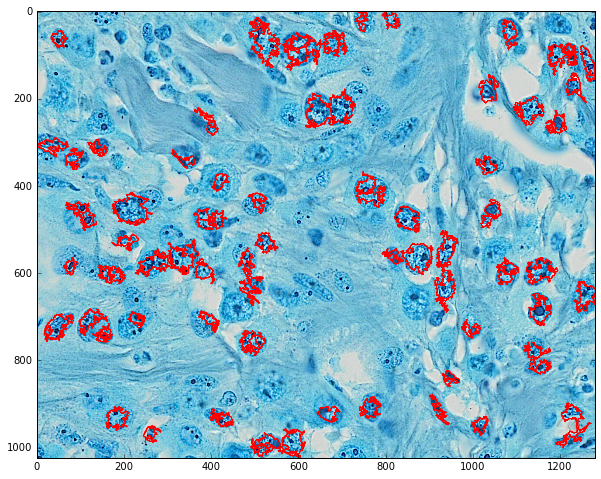

(<matplotlib.image.AxesImage at 0x7aa6b70>, None)

In [28]:
# -------- TEST WATERSHED ------------------
from skimage.feature import peak_local_max
from skimage.morphology import watershed
from scipy import ndimage

img = cv2.imread("Images/mp-16-2852_MCT_Ki67_1697.tif")
image = cv2.GaussianBlur(img, (0,0), 3)
frame = cv2.addWeighted(img, 1.5, image, -0.5, 0)

b,g,r = cv2.split(frame)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0] - rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

# black image and preprocessing of original image (unsharp masking)
general = np.zeros((1024,1280), np.uint8)
im = cv2.GaussianBlur(img, (0,0), 3)
img = cv2.addWeighted(img, 1.5, im, -0.5, 0)
thresh = cv2.inRange(img, (0,130,0),(255,255,225))
thresh = 255 - thresh
contour,_ = cv2.findContours(thresh,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
t1 = np.zeros(thresh.shape, np.uint8)
for cnt in contour:
    area = cv2.contourArea(cnt)
    if area >= 100:
        cv2.drawContours(t1,[cnt],0,255,-1)
dist = cv2.distanceTransform(t1, cv2.cv.CV_DIST_L2, 5)
localMax = peak_local_max(dist, indices=False, min_distance=20, labels=t1)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-dist, markers, mask=t1)
plt.imshow(labels), plt.show()
for label in np.unique(labels):
    if label == 0:
        continue
    labelled = np.zeros(dist.shape, dtype="uint8")
    labelled[labels == label] = 255
    cnts = cv2.findContours(labelled, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    for c in cnts:
        if cv2.contourArea(c) >= 500:
            cv2.drawContours(general, [c],0,255,-1)
            cv2.drawContours(img, [c], -1, (255,0,0), 2)
            
plt.imshow(img), plt.show()

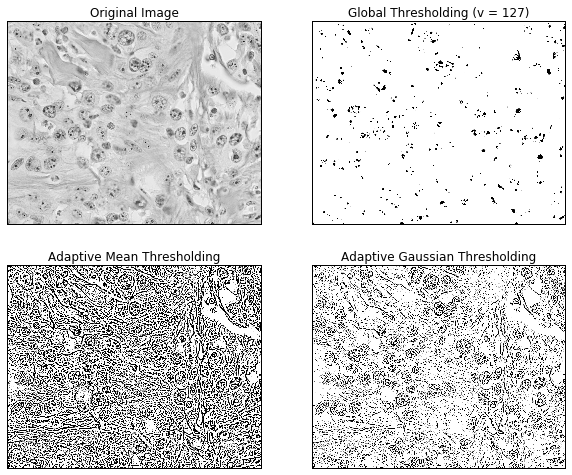

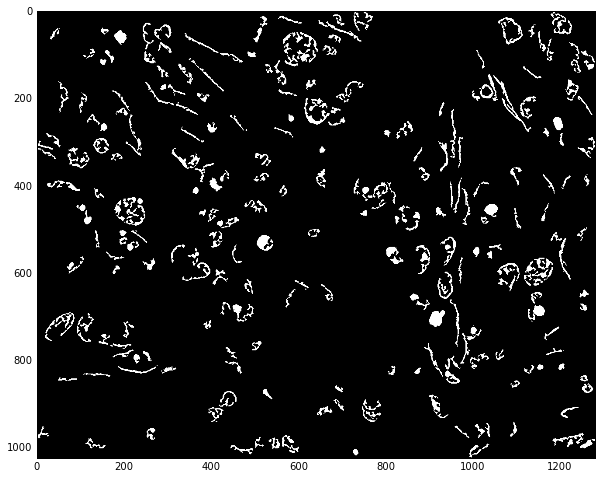

(<matplotlib.image.AxesImage at 0x1f23fac8>, None)

In [29]:
# --- Test Adaptive Thresholding -----------------
img = cv2.imread("Images/mp-16-2852_MCT_Ki67_1697.tif",0)
blur = cv2.medianBlur(img, 5)

ret, th1 = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
th3 = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

titles = ['Original Image', 'Global Thresholding (v = 127)', 'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [blur, th1, th2, th3]

for i in xrange(4):
    plt.subplot(2,2,i+1), plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])
plt.show()

th3 = 255 - th3
contour,_ = cv2.findContours(th3,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
t1 = np.zeros(th3.shape, np.uint8)
for cnt in contour:
    area = cv2.contourArea(cnt)
    if area >= 100:
        cv2.drawContours(t1,[cnt],0,255,-1)

plt.imshow(t1, 'gray'), plt.show()

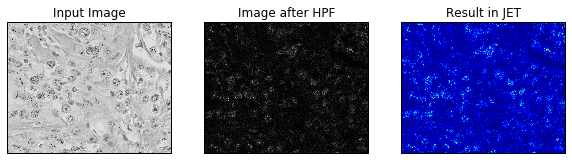

In [30]:
# --- OpenCV Fourier Transform Test ----------
img = cv2.imread("Images/mp-16-2852_MCT_Ki67_1697.tif",0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))


rows, cols = img.shape
crow, ccol = rows/2, cols/2
fshift[crow-50:crow+50, ccol-50:ccol+50] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.subplot(131), plt.imshow(img, cmap = 'gray')
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img_back, cmap='gray')
plt.title("Image after HPF"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(img_back)
plt.title("Result in JET"), plt.xticks([]), plt.yticks([])

plt.show()

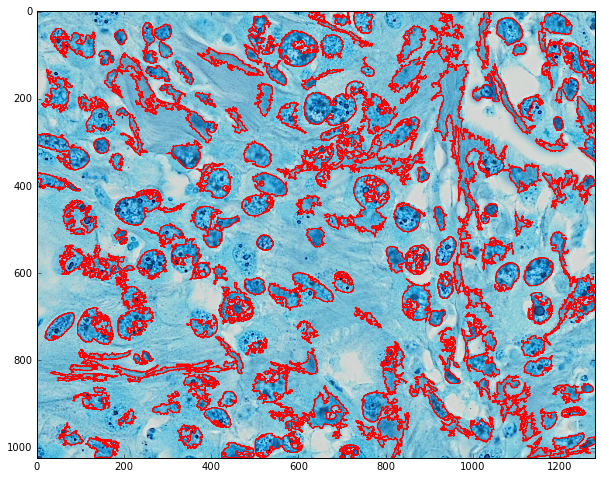

In [31]:
# ------ TESTING RGB THRESHOLDING ---------------------------------
img = cv2.imread('Images/mp-16-2852_MCT_Ki67_1697.tif')
image = cv2.GaussianBlur(img, (0,0), 3)
frame = cv2.addWeighted(img, 1.5, image, -0.5, 0)

thresh = cv2.inRange(frame, (0,0,0),(105, 185, 255))
#plt.imshow(thresh, 'gray')
#plt.show()

contours, heirarchy = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
cells = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area >= 500:
        cells.append(cnt)
        
cv2.drawContours(img, cells, -1, (255,0,0),2)
#cv2.imshow("Contours", dot_img)
#cv2.waitKey(-1)
plt.imshow(img)
plt.show() 

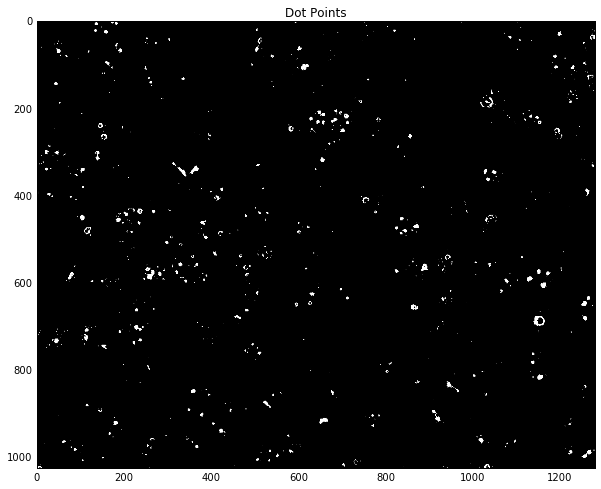

(<matplotlib.image.AxesImage at 0x1f98e780>,
 None)

In [32]:
# ---------HSV THRESHOLDING--DOTS--------------
b,g,r = cv2.split(img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0] - rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

dot_points = cv2.inRange(mask, (0, 50, 0), (255,255,150))
plt.imshow(dot_points, 'gray'), plt.title("Dot Points"), plt.show()

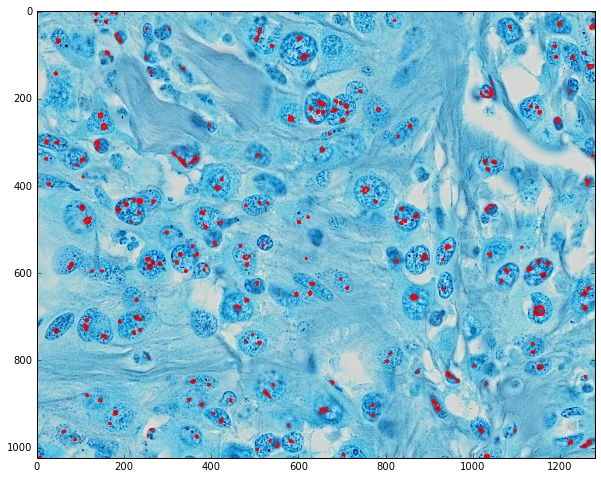

In [33]:
contours, heirarchy = cv2.findContours(dot_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
dots = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area >= 10:
        dots.append(cnt)
        
dot_img = cv2.imread('Images/mp-16-2852_MCT_Ki67_1697.tif')
cv2.drawContours(dot_img, dots, -1, (255,0,0),2)
#cv2.imshow("Contours", dot_img)
#cv2.waitKey(-1)
plt.imshow(dot_img)
plt.show()

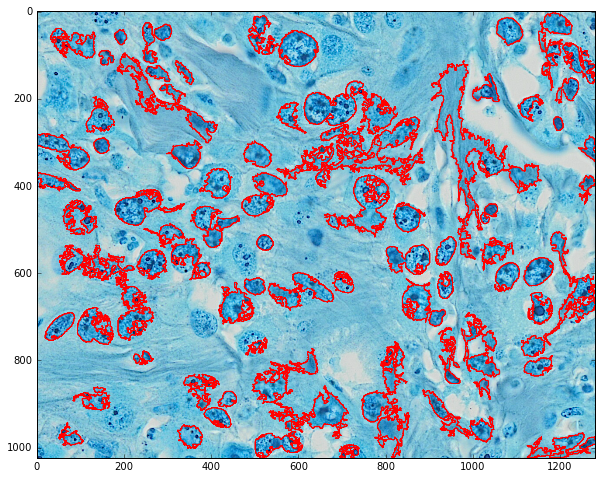

(<matplotlib.image.AxesImage at 0x10d2a9e8>, None)

In [34]:
total = []
for i in range(len(dots)):
    for j in range(len(dots[i])):
        for m in range(len(cells)):
            x = dots[i][j][0][0]
            y = dots[i][j][0][1]
            points = (x,y)
            num  = cv2.pointPolygonTest(cells[m], points, False )
            if num == 0 or num == 1:
                total.append(cells[m])
                
test_img = cv2.imread('Images/mp-16-2852_MCT_Ki67_1697.tif')
cv2.drawContours(test_img, total, -1, (255,0,0),2)
cv2.imshow("Contours", test_img)
cv2.waitKey(-1)
plt.imshow(test_img), plt.show()

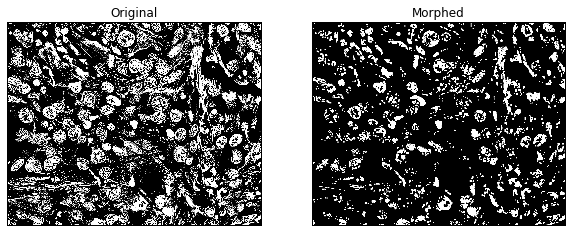

In [35]:
# --- Test using rgb thresholding and erosion/dilation ----------------------
img = cv2.imread("Images/mp-16-2852_MCT_Ki67_1697.tif")
image = cv2.GaussianBlur(img, (0,0), 3)
frame = cv2.addWeighted(img, 1.5, image, -0.5, 0)

thresh = cv2.inRange(frame, (0,0,0),(105, 185, 255))
kernel = np.ones((5,5), np.uint8)
#erosion = cv2.erode(thresh, kernel, iterations = 2)
#dilation = cv2.dilate(erosion, kernel, iterations = 2)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
plt.subplot(121), plt.imshow(thresh, 'gray')
plt.title("Original"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(opening, 'gray')
plt.title("Morphed"), plt.xticks([]), plt.yticks([])
plt.show()

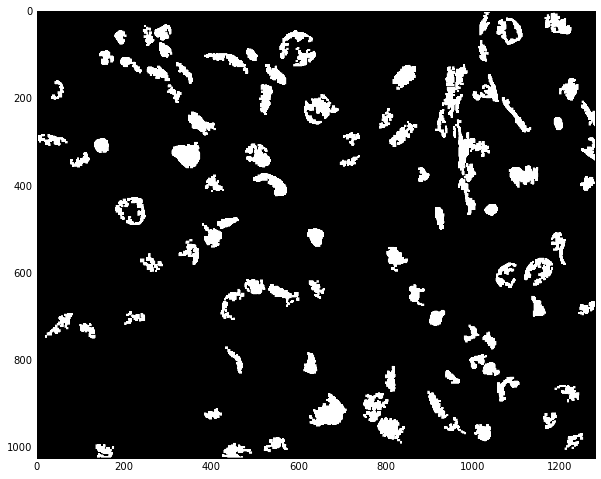

In [36]:
t1 = np.zeros(opening.shape, np.uint8)
contours, heirarchy = cv2.findContours(opening, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
for c in contours:
    if cv2.contourArea(c) >= 500:
        cv2.drawContours(t1, [c],0,255,-1)
#cv2.drawContours(img, contours, -1, (255,0,0),2)
#cv2.imshow("Contours", t1)
cv2.waitKey(-1)
plt.imshow(t1, 'gray')
plt.show() 

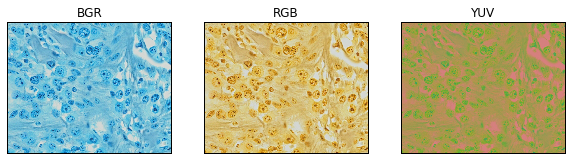

In [37]:
# ---- TESTING YUV COLORSPACE -------------------------
img = cv2.imread("Images/mp-16-2852_MCT_Ki67_1697.tif")
img = cv2.medianBlur(img, 5)
b,g,r = cv2.split(img)
rg = cv2.merge([r,g,b])
bgr_y = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
yu = cv2.cvtColor(rg, cv2.COLOR_RGB2YUV)

plt.subplot(131), plt.imshow(img), plt.title("BGR"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(rg), plt.title("RGB"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(yu), plt.title("YUV"), plt.xticks([]), plt.yticks([])
plt.show()

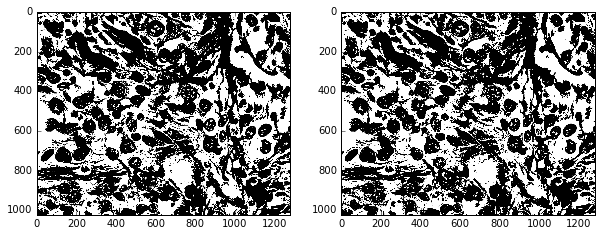

In [38]:
thresh_yuv = cv2.inRange(yu, (175,0,0),(255,255,255))
bgr_yuv = cv2.inRange(bgr_y, (175,0,0), (255,255,255))
plt.subplot(221), plt.imshow(thresh_yuv, 'gray')
plt.subplot(222), plt.imshow(bgr_yuv, 'gray')
thresh_yuv = 255 - thresh_yuv
bgr_yuv = 255 - bgr_yuv 
plt.show()

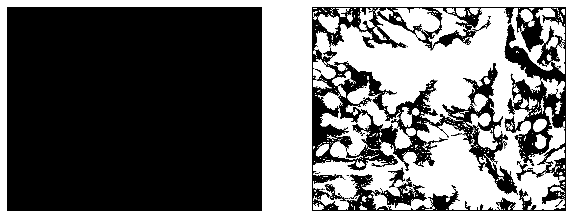

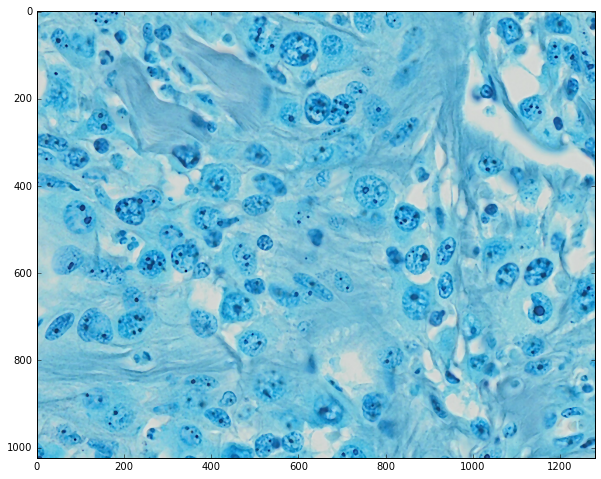

(<matplotlib.image.AxesImage at 0x2be82518>, None)

In [39]:
c, h = cv2.findContours(bgr_yuv, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
t1 = np.zeros(bgr_yuv.shape, np.uint8)
t2 = np.zeros(bgr_yuv.shape, np.uint8)
cells = []
for cnt in c:
    area = cv2.contourArea(cnt)
    true_area = cv2.contourArea(cnt, True)
    if area >= 500 and area < 10000 and true_area < 0 and circularity_factor > 0.025:
        cv2.drawContours(t1, [cnt], 0, 255, -1)
        cv2.drawContours(img, [cnt], -1, (255,0,0), 3)
        cells.append(cnt)
    else:
        cv2.drawContours(t2, [cnt], 0 , 255, -1)
        
plt.subplot(121), plt.imshow(t1, 'gray'), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(t2, 'gray'), plt.xticks([]), plt.yticks([])
plt.show()
plt.imshow(img), plt.show()

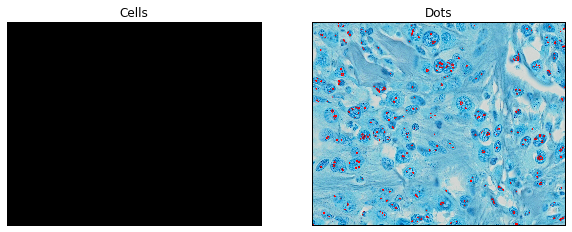

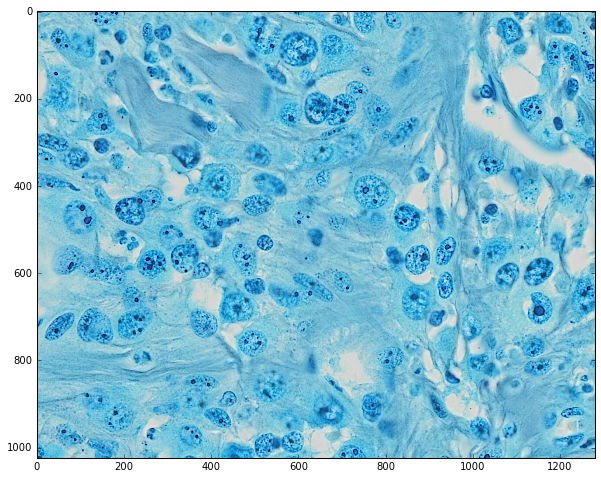

(<matplotlib.image.AxesImage at 0x80a19b0>, None)

In [41]:
# ---------HSV THRESHOLDING--DOTS--------------
b,g,r = cv2.split(img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0] - rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

dot_points = cv2.inRange(mask, (0, 50, 0), (255,255,150))
dots, heirarchy = cv2.findContours(dot_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
        
dot_img = cv2.imread('Images/mp-16-2852_MCT_Ki67_1697.tif')
cv2.drawContours(dot_img, dots, -1, (255,0,0),2)
#cv2.imshow("Contours", dot_img)
#cv2.waitKey(-1)
plt.subplot(121), plt.imshow(t1, 'gray'), plt.xticks([]), plt.yticks([]), plt.title('Cells')
plt.subplot(122), plt.imshow(dot_img), plt.xticks([]), plt.yticks([]), plt.title("Dots")
plt.show()

total = []
for i in range(len(dots)):
    for j in range(len(dots[i])):
        for m in range(len(cells)):
            x = dots[i][j][0][0]
            y = dots[i][j][0][1]
            points = (x,y)
            num  = cv2.pointPolygonTest(cells[m], points, False )
            if num == 0 or num == 1:
                total.append(cells[m])
                
test_img = cv2.imread('Images/mp-16-2852_MCT_Ki67_1697.tif')
cv2.drawContours(test_img, total, -1, (255,0,0),2)
#cv2.imshow("Contours", test_img)
#cv2.waitKey(-1)
plt.imshow(test_img), plt.show()

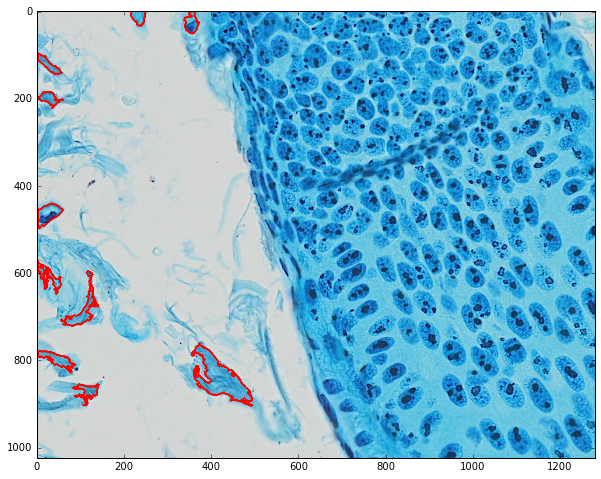

(<matplotlib.image.AxesImage at 0x2eea54a8>, None)

In [45]:
cell_img = cv2.imread("Images/mp-16-2906_MCT_Ki67_942.tif")
y = cv2.cvtColor(cell_img, cv2.COLOR_BGR2YUV)
im_th = cv2.inRange(y, (0,155,0), (255,255,255))
im_floodfill = im_th.copy()
h,w = im_th.shape[:2]
mask = np.zeros((h+2, w+2), np.uint8)
cv2.floodFill(im_floodfill, mask, (0,0), 255)
im_floodfill_inv = cv2.bitwise_not(im_floodfill)
im_out = im_th | im_floodfill_inv

cells = []
c, _ = cv2.findContours(im_out, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
for cnt in c:
    area = cv2.contourArea(cnt)
    true_area = cv2.contourArea(cnt, True)
    x,y,w,h = cv2.boundingRect(cnt)
    aspect_ratio = float(w)/h
    if area > 750 and aspect_ratio > 0.5 and area < 20000 and true_area < 0: 
        cv2.drawContours(cell_img, [cnt], -1, (255,0,0), 3)
        cells.append(cnt)
plt.imshow(cell_img), plt.show()

307


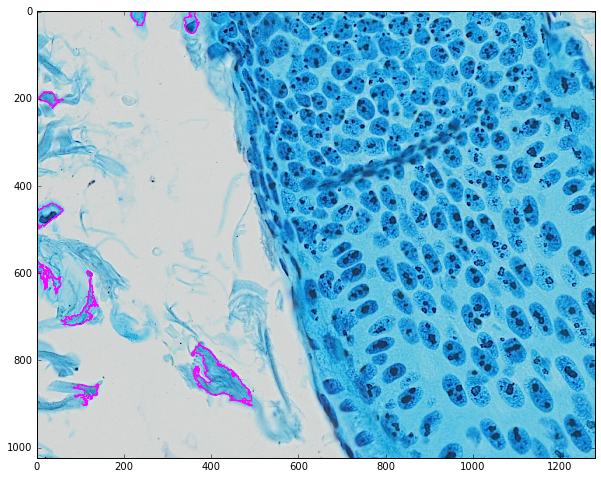

(<matplotlib.image.AxesImage at 0x2bef8668>, None)

In [46]:
# ---------HSV THRESHOLDING--DOTS--------------
dot_img = cv2.imread('Images/mp-16-2906_MCT_Ki67_942.tif')
final_img = dot_img.copy()
b,g,r = cv2.split(dot_img)
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0] - rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

dot_points = cv2.inRange(mask, (0, 50, 0), (255,255,150))
dots, heirarchy = cv2.findContours(dot_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

cv2.drawContours(dot_img, dots, -1, (255,0,0),2)

#plt.imshow(dot_img), plt.xticks([]), plt.yticks([]), plt.title("Dots"), plt.show()

total = []

for i in range(len(dots)):
    for j in range(len(dots[i])):
        for m in range(len(cells)):
            x = dots[i][j][0][0]
            y = dots[i][j][0][1]
            points = (x,y)
            num  = cv2.pointPolygonTest(cells[m], points, False )
            if num == 0 or num == 1:
                total.append(cells[m])
                cv2.drawContours(final_img, [cells[m]], -1, (255,0,255), 2)
                
print(len(total))
plt.imshow(final_img), plt.show()